In [11]:
import torch
from sklearn.model_selection import train_test_split
from load_data import sim_arr

# reshape from batch, height, width, channel, to batch, channel, height, width
sim_arr_transformed = sim_arr.reshape(
    sim_arr.shape[0], sim_arr.shape[3], sim_arr.shape[1], sim_arr.shape[2])

sim_arr_tensor = torch.tensor(sim_arr_transformed, dtype=torch.float32)

# train test split
train_data, test_data = train_test_split(
    sim_arr_tensor, test_size=0.2, random_state=42, shuffle=True)

In [12]:
from torch import nn

num_layers = 5
poolsize = [2, 2, 2, 2, 5]
channels = [3, 12, 7, 7, 11, 12]
kernel_sizes = [15, 10, 14, 14, 14]
dilations = [5, 5, 3, 3, 1]
activations = [nn.SiLU, nn.Tanh, nn.Softplus, nn.SiLU, nn.SiLU]
learning_rate = 0.0002568457560593339
batch_size = 32
epochs = 200

In [13]:
from ae import Encoder, Decoder, AutoEncoder
from cross_validation import train_model, evaluate_model

encoder = Encoder(num_layers, poolsize, channels, kernel_sizes, dilations, activations)
decoder = Decoder(encoder)
model = AutoEncoder(encoder, decoder)

train_model(model, train_data,
            lr=learning_rate,
            batch_size=batch_size,
            epochs=epochs)
evaluate_model(model, test_data,
               batch_size=batch_size)

Test Loss: 9193.4175


9193.417469113372

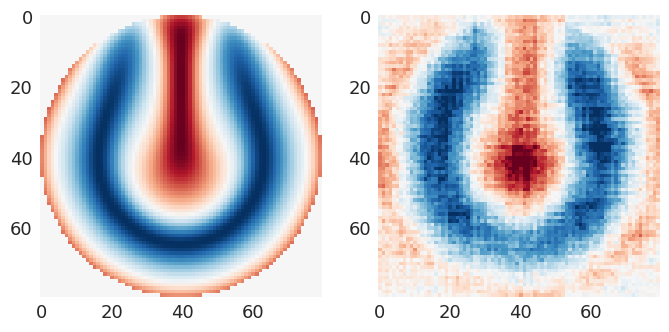

In [14]:
import numpy as np
import matplotlib.pyplot as plt

i = np.random.randint(0, len(test_data))
in_sim = test_data[i: i + 1]
in_sim = in_sim.to('cuda:0')
out_sim = model(in_sim)
in_sim = in_sim.detach().to('cpu').numpy()
in_sim = in_sim.reshape(
    in_sim.shape[0], in_sim.shape[2], in_sim.shape[3], in_sim.shape[1])
out_sim = out_sim.detach().to('cpu').numpy()
out_sim = out_sim.reshape(
    out_sim.shape[0], out_sim.shape[2], out_sim.shape[3], out_sim.shape[1])
fig, ax = plt.subplots(nrows=1, ncols=2)
ax[0].imshow(in_sim[0, ..., 2], vmin=-1, vmax=1, cmap="RdBu")
ax[1].imshow(out_sim[0, ..., 2], vmin=-1, vmax=1, cmap="RdBu")

feature_array = model.encoder(sim_arr_tensor.to('cuda:0')).detach().to('cpu').numpy()
feature_array = feature_array.reshape(
    feature_array.shape[0], feature_array.shape[1] * feature_array.shape[2] * feature_array.shape[3])

In [15]:
from sklearn.cluster import AgglomerativeClustering

clustering = AgglomerativeClustering(n_clusters=16).fit(feature_array)

labels = clustering.labels_

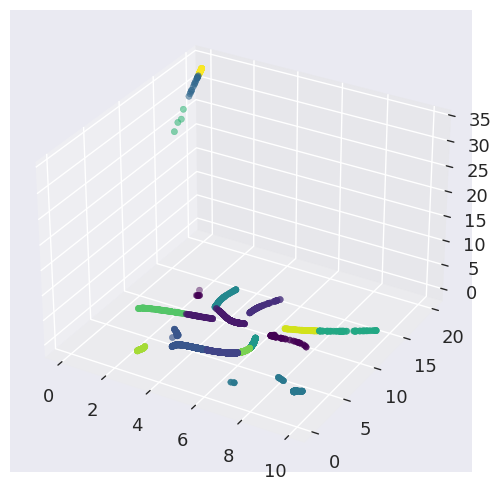

In [16]:
# plot the feature array in 3D with the labels as colors

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# feature_array = feature_array[0].detach().to('cpu').numpy()
ax.scatter(feature_array[:, 0], feature_array[:, 1],
           feature_array[:, 2], c=labels)

In [17]:
from cluster_acc import adj_rand_index, purity

print("Adjusted Rand Index: ", adj_rand_index(labels))
print("Purity: ", purity(labels))

Adjusted Rand Index:  0.002958934329722216
Purity:  0.14750830564784054


In [18]:
import plotly.express as ptx
import plotly.graph_objs as go
from load_data import parameters_dict, simulation_file_paths
print(len(set(labels)) - (1 if -1 in labels else 0))


class_dict = {f"Class {i}": list() for i in range(len(set(labels)))}
class_dict["Outliers"] = list()
for index, path in enumerate(simulation_file_paths):
    class_ = labels[index]
    if class_ == -1:
        class_dict["Outliers"].append(str(path))
    else:
        class_dict[f"Class {class_}"].append(str(path))

traces = list()
for class_id, colour in zip(class_dict, ptx.colors.qualitative.Dark24):
    traces.append(
        go.Scatter(
            x=[
                parameters_dict[f]["H"]
                for f in class_dict[class_id]
            ],
            y=[
                parameters_dict[f]["E"]
                for f in class_dict[class_id]
            ],
            mode="markers",
            name=class_id,
            opacity=0.7,
            marker=dict(
                size=11,
                color=colour,
            ),
        )
    )

fig = go.Figure(data=traces)
fig.update_layout(
    autosize=False,
    width=990,
    height=600,
    margin=dict(
        l=10,
        r=10,
        b=25,
        t=25,
    ),
    xaxis_title=r"$\mu_0 \mathbf{H} \text{ (T)}$",
    yaxis_title=r"$\Delta \text{E (J)}$",
)

16


ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'marker': {'color': '#2E91E5', 'size': 11},
              'mode': 'markers',
              'name': 'Class 0',
              'opacity': 0.7,
              'type': 'scatter',
              'x': [0.05556525292833445, 0.05556525292833445, 0.05767995912901584,
                    0.17335539617312118, 0.12282567902694742, 0.1200051235924728,
                    0.09896463765738081, 0.16233320056405595,
                    0.0049577451594033485, 0.104560520146578, 0.07527286362065425,
                    0.09343237728599144, 0.08067118301082754, 0.13930175741253814,
                    0.12024626663464288, 0.10404936148175352, 0.16160298068677026,
                    0.12152269818476434, 0.06415061172236722, 0.048397381135607716,
                    0.10282549835843335, 0.15679231120900416, 0.15675005568735337,
                    0.10628000491945659, 0.06405041147039583, 0.012202489987678432,
                    0.09520598533519938, 0.0680853551098887, 0.029335013094577887,
                    0.029335013094577887, 0.0045748663348678335,
                    0.1290774946406727, 0.1511396584396841, 0.1847971783887045,
                    0.01842989869844196, 0.01842989869844196, 0.10862032555585044,
                    0.020055601051892014, 0.020055601051892014,
                    0.13120496795805647, 0.1467594265549136, 0.12314500844208708,
                    0.013790040024915795, 0.013790040024915795, 0.1796772163756774],
              'y': [1.2458693366999986e-18, 1.5391056866000006e-18,
                    1.567593075200002e-18, 3.0694505144000003e-18,
                    2.4461839118000016e-18, 2.4085348176999985e-18,
                    2.125160466599999e-18, 2.9460389833e-18, 8.566783187999982e-19,
                    2.2007798165000007e-18, 1.804879526100001e-18,
                    2.0503474193000006e-18, 1.8778042443e-18,
                    2.6624539375000023e-18, 2.4117585513000014e-18,
                    2.1938762404000003e-18, 2.937529694800001e-18,
                    2.4288076678000013e-18, 1.6548022013000009e-18,
                    1.4425851981e-18, 2.1773433013e-18, 2.8805659491999996e-18,
                    2.880058938099999e-18, 2.2239949141e-18,
                    1.6534512023999982e-18, 9.23365906800001e-19,
                    2.0743345657000008e-18, 1.7078687337000008e-18,
                    1.0745483784999979e-18, 1.1859402236999999e-18,
                    8.531260587000029e-19, 2.529095760799999e-18,
                    2.8117953365999996e-18, 3.185130407300001e-18,
                    1.0388577159000007e-18, 9.796657046000015e-19,
                    2.2555690312000007e-18, 1.0608095106000016e-18,
                    9.941603970000021e-19, 2.5571034817000023e-18,
                    2.7572995599000014e-18, 2.4504379185000008e-18,
                    9.761400282999977e-19, 9.378223878999999e-19,
                    3.1352367975999982e-18]},
             {'marker': {'color': '#E15F99', 'size': 11},
              'mode': 'markers',
              'name': 'Class 1',
              'opacity': 0.7,
              'type': 'scatter',
              'x': [1.0229688740778602, 0.8649326048187083, 1.0526020064240975,
                    ..., 1.0469586493867697, 1.0976181620612193,
                    1.0976181620612193],
              'y': [0.0, 0.0, 0.0, ..., 0.0, 2.632159098500011e-18, 0.0]},
             {'marker': {'color': '#1CA71C', 'size': 11},
              'mode': 'markers',
              'name': 'Class 2',
              'opacity': 0.7,
              'type': 'scatter',
              'x': [1.0229688740778602, 0.8649326048187083, 1.0526020064240975,
                    1.1947724585988408, 1.072535115051649, 1.0847157664043714,
                    0.8897489695747208, 1.0544923781969306, 1.0520917899467686,
                    1.0485608360241712, 0.9934355497864474, 0.8362432922424539,
                    1.116615272717344, 0.9748296910160761, 1.1827621140750701,
                    1.051

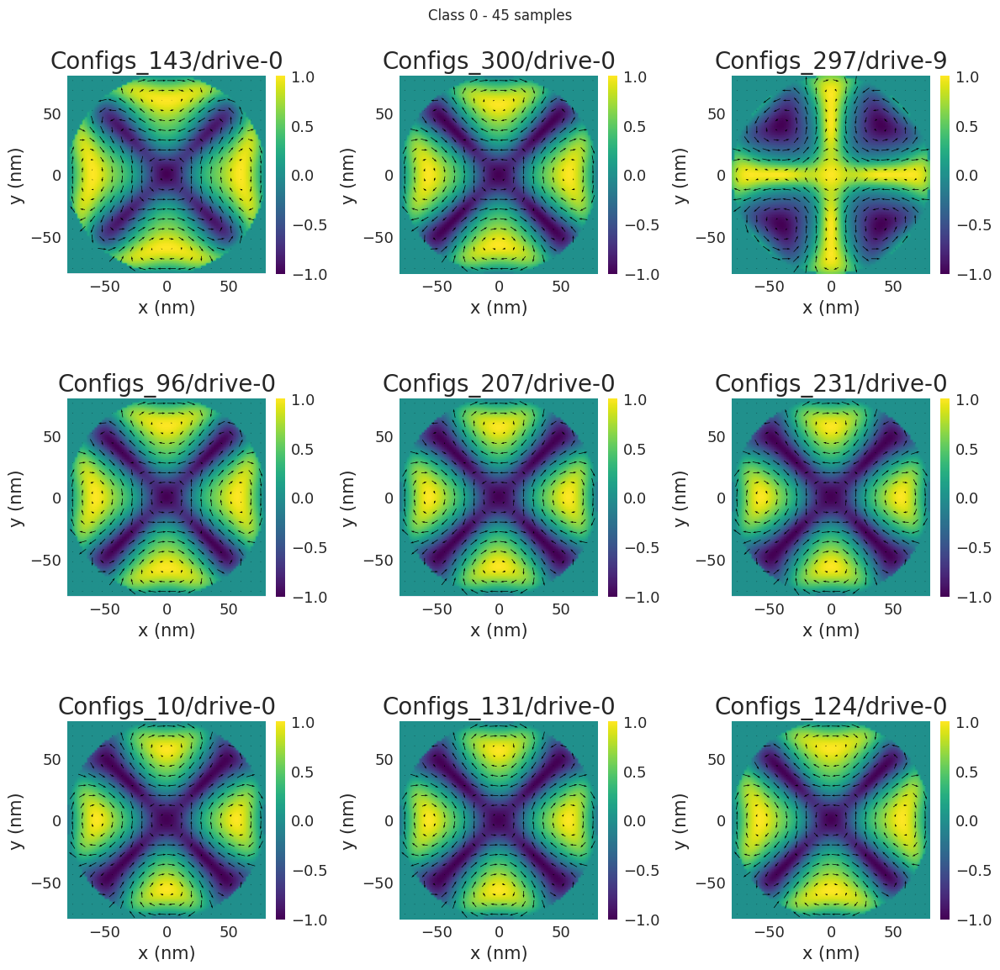

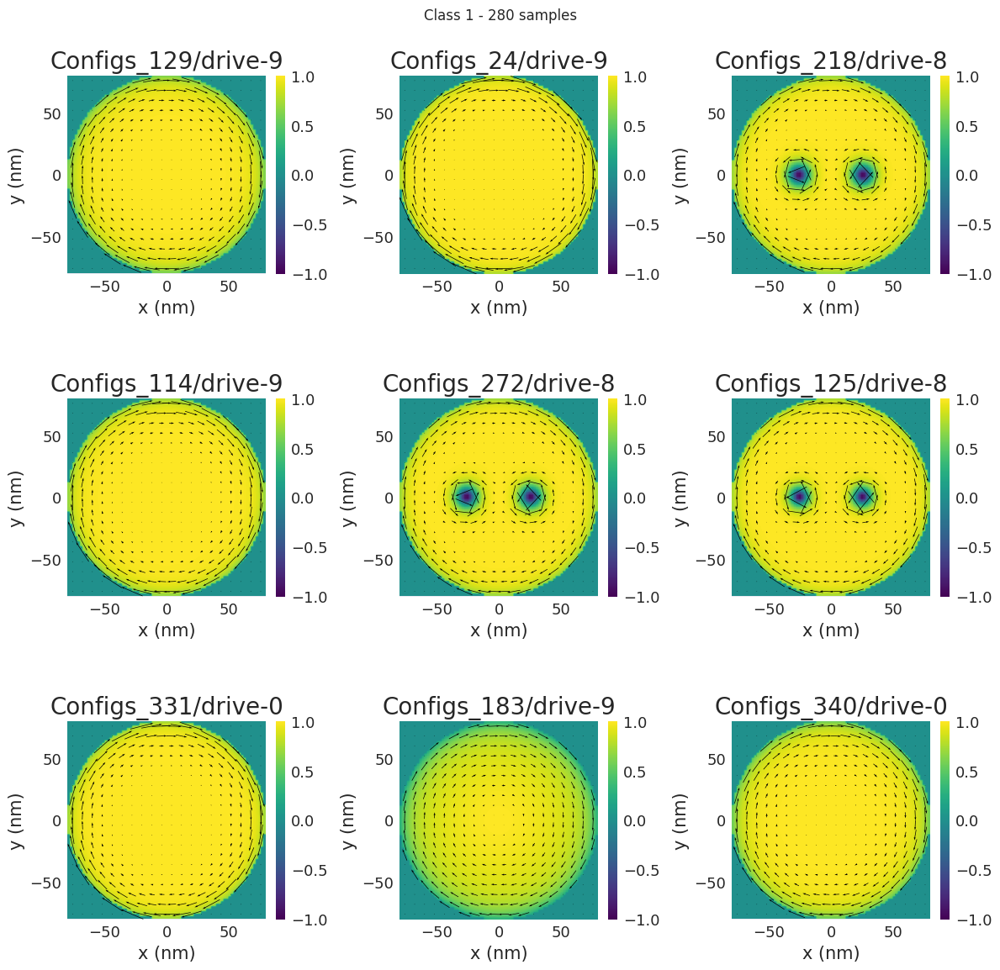

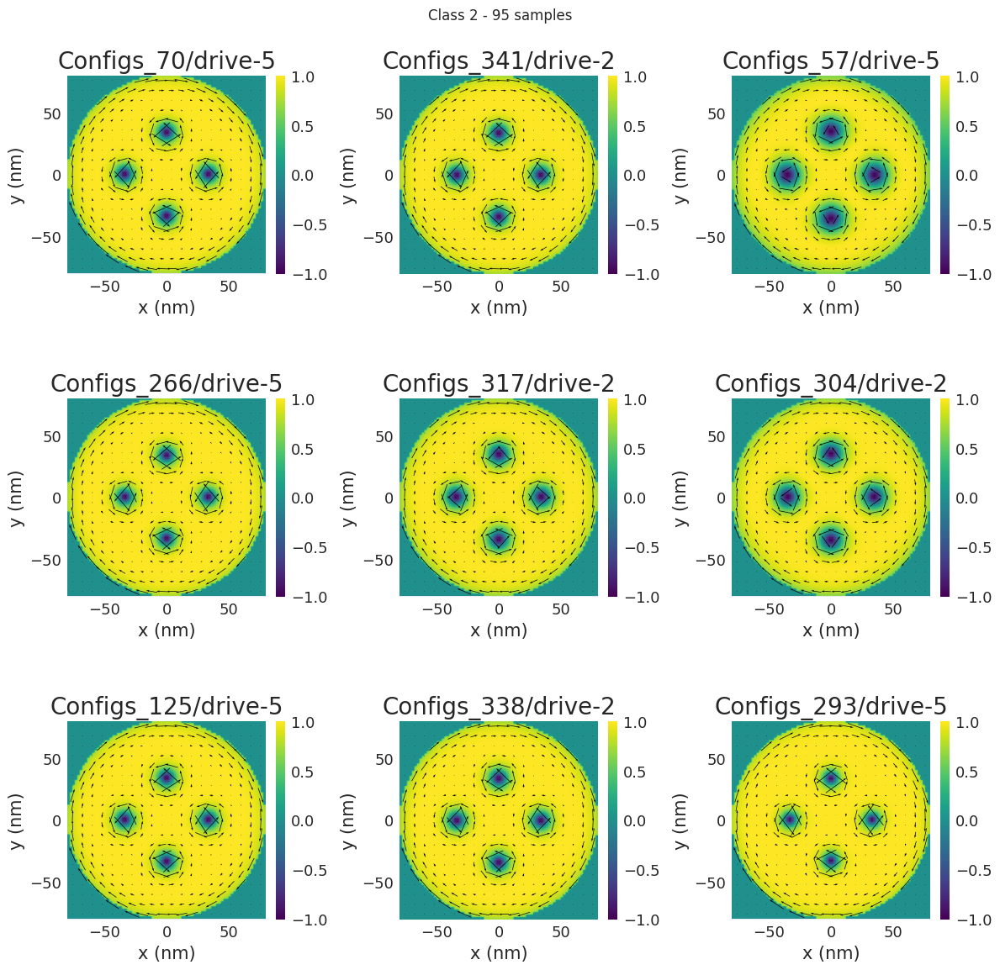

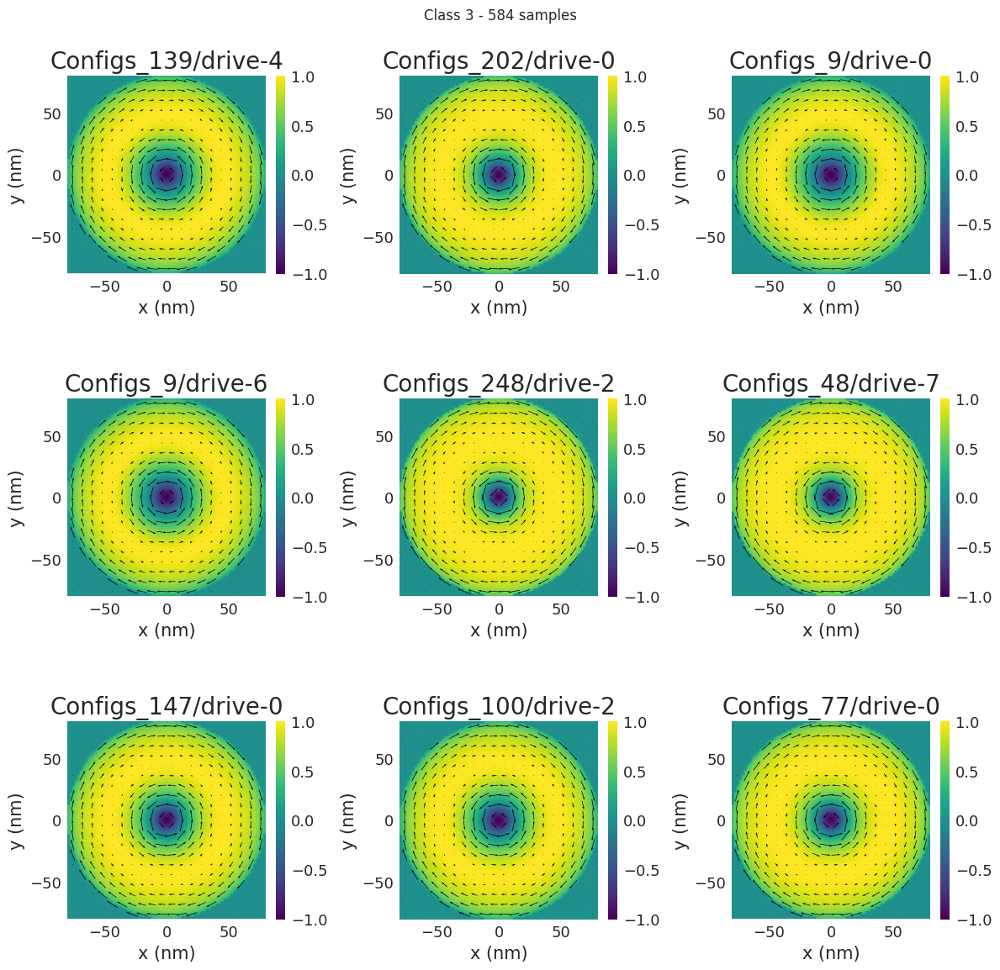

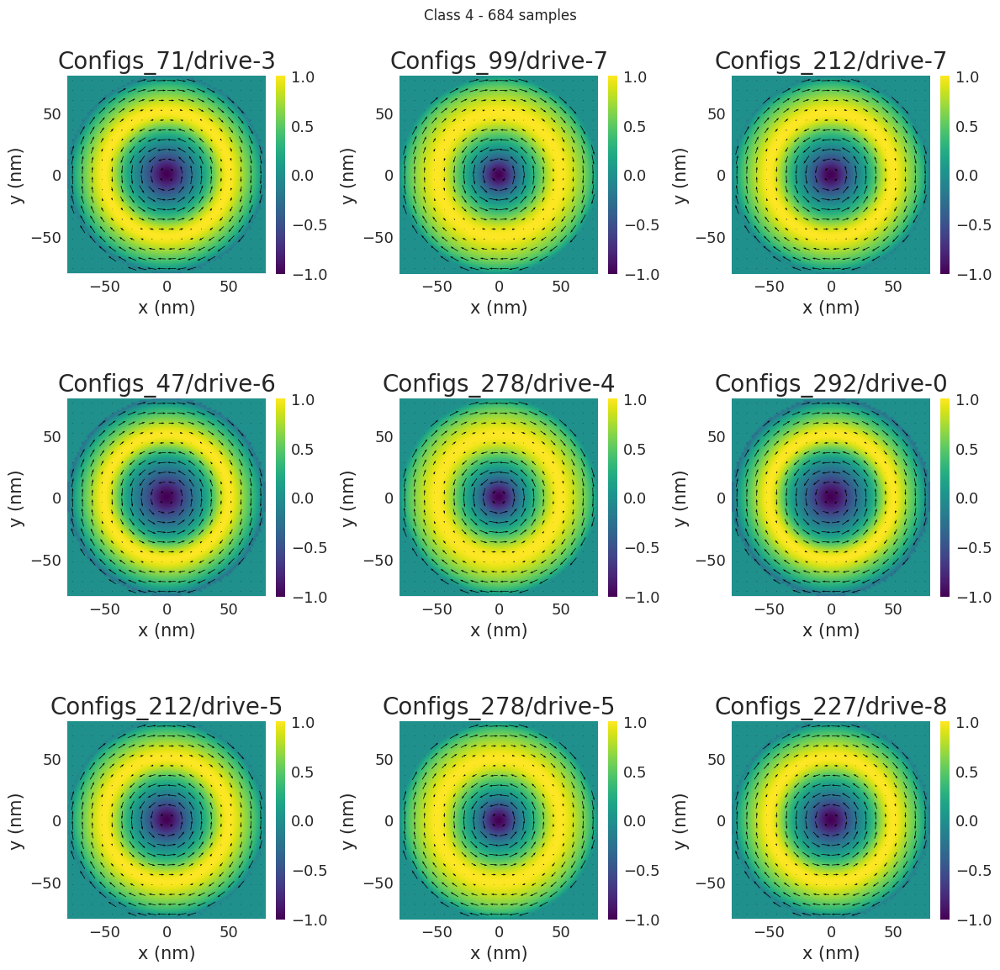

...

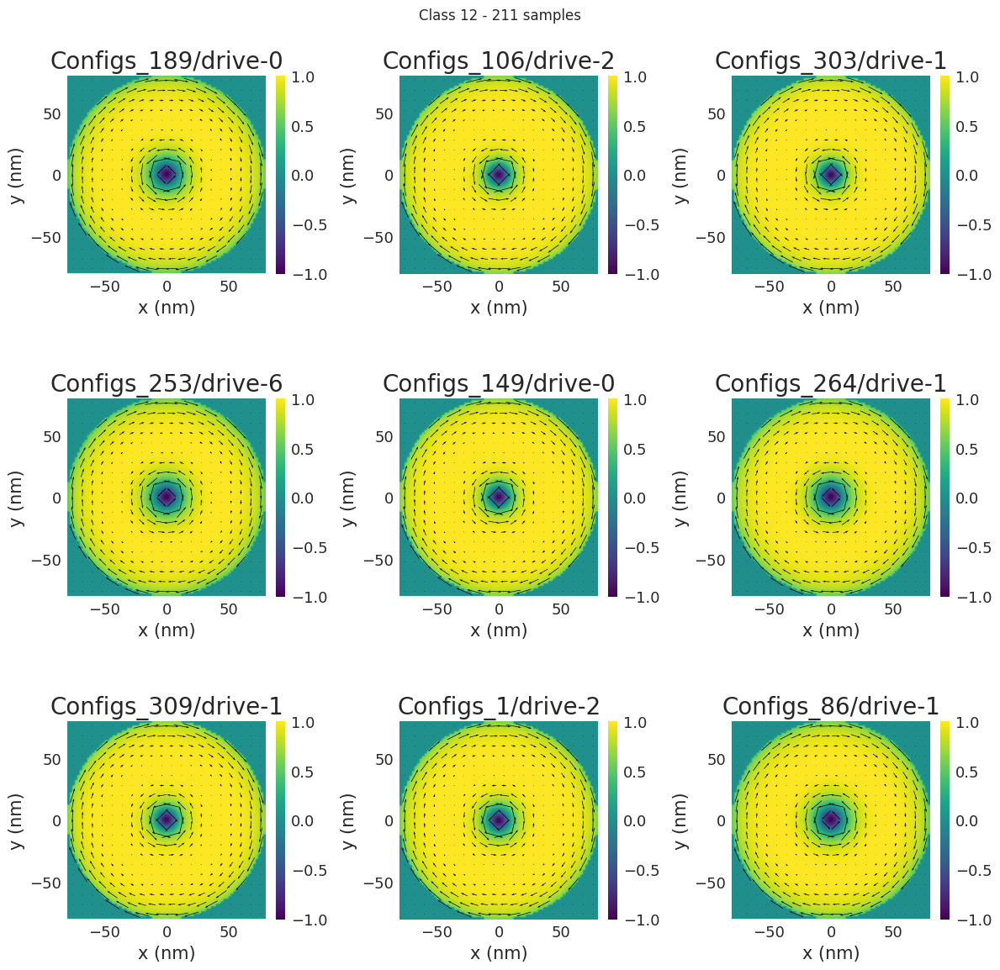

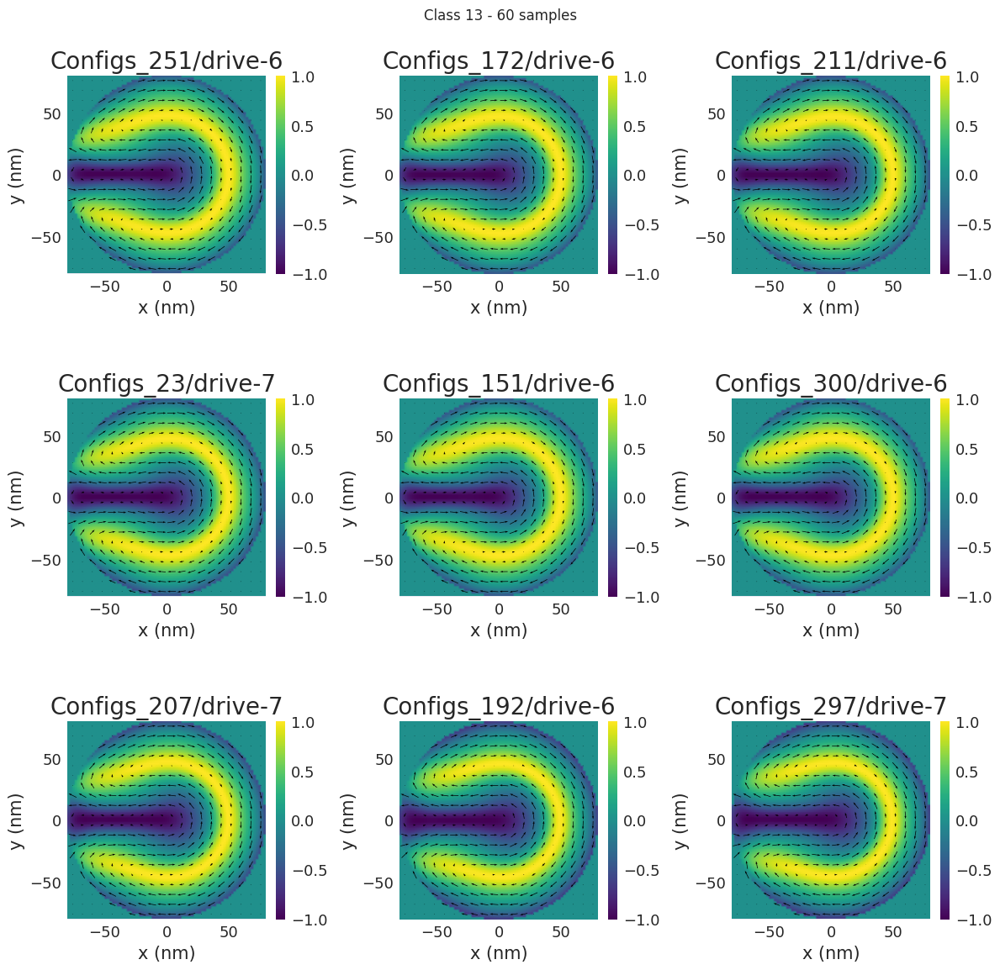

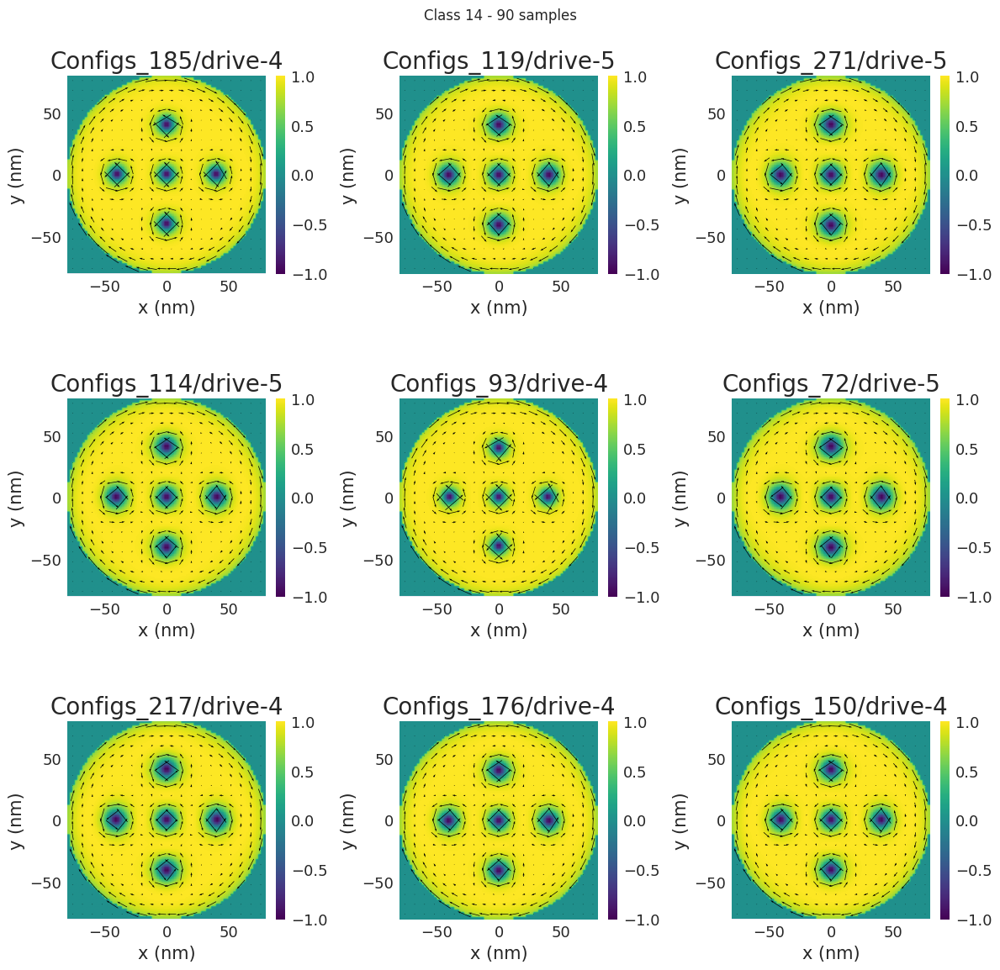

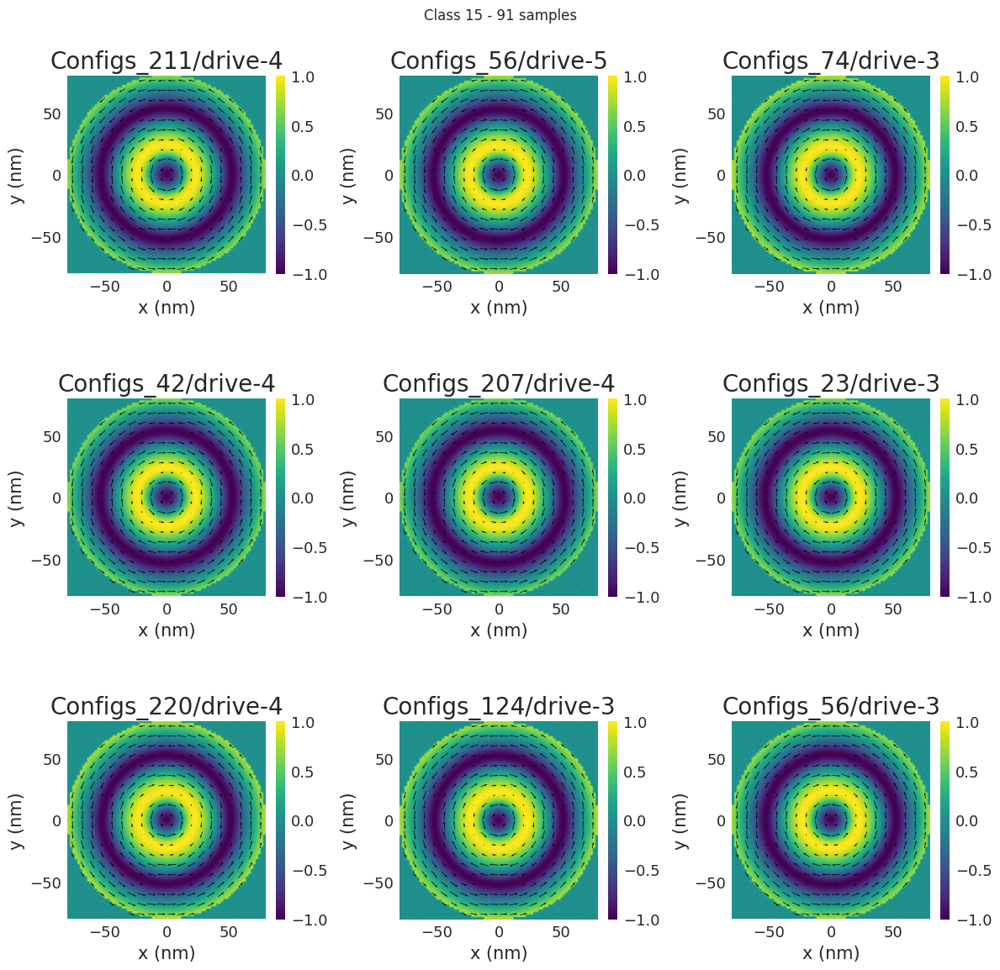

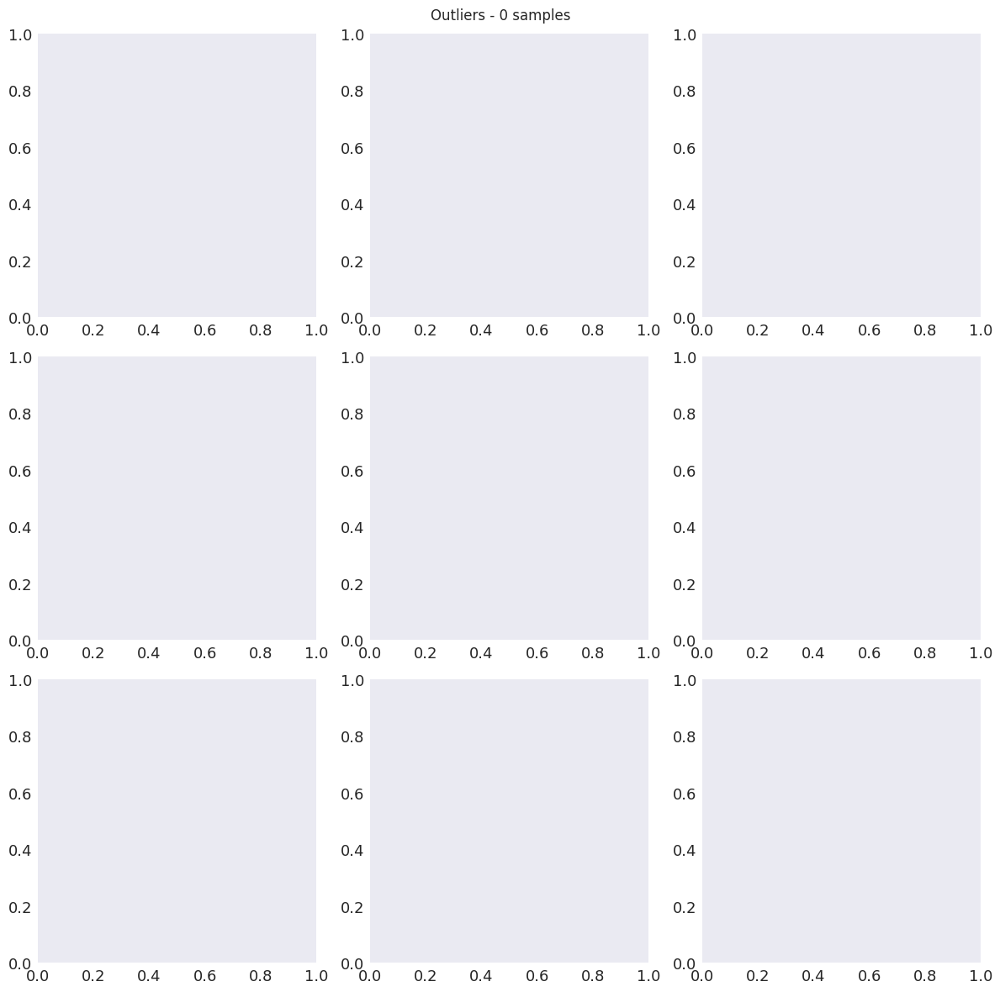

In [19]:
from plotting import plot_all_examples

plot_all_examples(class_dict, parameters_dict)